In [15]:
#Import libraries
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# **Dataset Creation**

In [36]:
# Hyper-parameters initialization because they are needed in the following cell
input_size = 784 # 28x28
hidden= 100
output_size = 10
epochs = 200
batch_size = 128
learning_rate = 0.01

In [37]:
#I could use the code of Assignment 2 to import the data but since it takes a while to upload them to google colab, i will use the following :

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [38]:
for images, labels in train_loader:
    print(images.shape)
    print(labels.shape)
    break

torch.Size([128, 1, 28, 28])
torch.Size([128])


# **Model Architecture**

In [39]:
#There is no ex1.4 is previous assignment, so i will implement two hidden layer neural network

# Hyper-parameters initialization because they are needed in the following cell
input_size = 784 # 28x28
hidden= 100
output_size = 10
epochs = 200
batch_size = 128
learning_rate = 0.01

class T_L_NeuralNetwork(nn.Module):
  def __init__(self,input_size,hidden,output_size):
    super(T_L_NeuralNetwork, self).__init__()
    self.l1 = nn.Linear(input_size,hidden)
    self.relu = nn.ReLU()
    self.l2 = nn.Linear(hidden,output_size)

  def forward(self,x):
    out = self.l1(x)
    out = self.relu(out)
    out = self.l2(out)
    #We dont use the softmax function here because when we define our loss (cross_entropy) the softmax function will be automatically applied there
    return out

model = T_L_NeuralNetwork(input_size, hidden, output_size).to(device) #With .to(device) we take advantage of GPU

# **Model Training**

In [40]:
# Test the model: we don't need to compute gradients
def evaluate(model,loader):
  with torch.no_grad():
      n_correct = 0
      losses = 0
      n_samples = len(test_loader.dataset)

      for images, labels in test_loader:
          images = images.reshape(-1, 28*28).to(device)
          labels = labels.to(device)

          outputs = model(images)

          # max returns (output_value ,index)
          _, predicted = torch.max(outputs, 1)
          n_correct += (predicted == labels).sum().item()
          losses += cross_entropy_loss(outputs,labels).item()


      acc = n_correct / n_samples
      loss = losses/n_samples
  return loss,acc

Epoch [1/200], Training Loss: 0.0018, Training Accuracy: 0.930839342948718, Test Loss: 0.0011628578083589672 Test accuracy: 0.9539
Epoch [2/200], Training Loss: 0.0009, Training Accuracy: 0.9662459935897436, Test Loss: 0.0008611065646575298 Test accuracy: 0.969
Epoch [3/200], Training Loss: 0.0007, Training Accuracy: 0.9729066506410257, Test Loss: 0.0008692761738726403 Test accuracy: 0.9686
Epoch [4/200], Training Loss: 0.0006, Training Accuracy: 0.9787326388888888, Test Loss: 0.0009188022630405613 Test accuracy: 0.9684
Epoch [5/200], Training Loss: 0.0006, Training Accuracy: 0.9799011752136753, Test Loss: 0.0009062314340029843 Test accuracy: 0.9703
Epoch [6/200], Training Loss: 0.0005, Training Accuracy: 0.9825721153846154, Test Loss: 0.0009872094737394946 Test accuracy: 0.9691
Epoch [7/200], Training Loss: 0.0005, Training Accuracy: 0.9841579861111112, Test Loss: 0.001090174839579413 Test accuracy: 0.9731
Epoch [8/200], Training Loss: 0.0004, Training Accuracy: 0.9845085470085471, Te

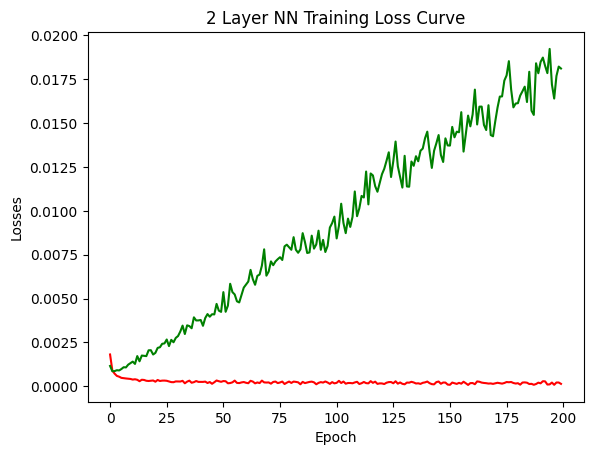

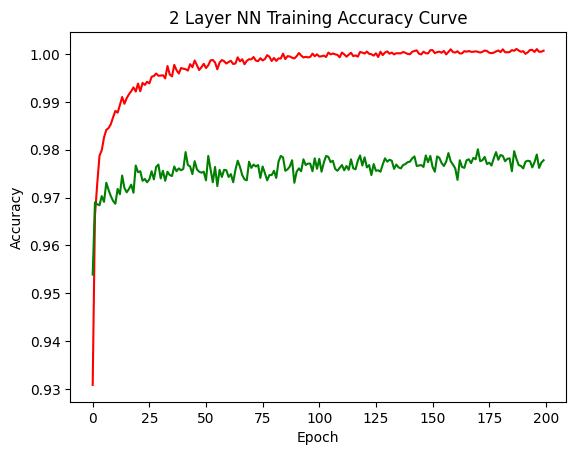

In [41]:
#Define Loss and optimizer (we will use Adam optimizer)

cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

#Define accuracy fucntion
def accuracy(outputs,labels,batch_size):
  n_correct = 0

  _, predicted = torch.max(outputs, 1)
  n_correct += (predicted == labels).sum().item()

  acc = n_correct / batch_size
  return acc

n_total_steps = len(train_loader)
losses = []
accs = []
test_losses = []
test_accs = []
n_samples = len(train_loader.dataset)
for epoch in range(epochs):
  running_loss = 0
  running_acc = 0
  for i,(images,labels) in enumerate(train_loader):
    #we need to reshape cuz current image has shape (batch_size,1,28,28)
    images = images.reshape(-1,28*28).to(device)
    labels = labels.to(device)

    #Do forward pass and loss calculation
    output = model(images)

    loss = cross_entropy_loss(output,labels)
    running_loss +=loss.item()

    acc = accuracy(output,labels,batch_size)
    running_acc +=acc


    #Backward propagation and optimaze according to gradients
    loss.backward()
    optimizer.step()
    optimizer.zero_grad() # for each batch of images, we want to reset our optimizer since we want to calculate the gradients of the specific batch

  #Evaluation on test set
  test_loss,test_acc = evaluate(model,test_loader)


  print (f'Epoch [{epoch+1}/{epochs}], Training Loss: {running_loss/n_samples:.4f}, Training Accuracy: {running_acc/i}, Test Loss: {test_loss} Test accuracy: {test_acc}')
  losses.append(running_loss/n_samples)
  accs.append(running_acc/i)
  test_losses.append(test_loss)
  test_accs.append(test_acc)

num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('2 Layer NN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('2 Layer NN Training Accuracy Curve')
plt.show()





# **CNN Implementation**

In [50]:
epochs = 40
batch_size = 128
learning_rate = 0.01

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [51]:
def evaluate(model,loader):

  model.eval()

  with torch.no_grad():
      n_correct = 0
      n_correct2 = 0
      n_samples = len(test_loader.dataset)
      running_loss = 0

      for images, labels in test_loader:
          images = images.to(device)
          labels = labels.to(device)
          outputs = model(images)

          #Calculate loss
          loss = cross_entropy_loss(outputs, labels)
          running_loss +=loss.item()

          # max returns (value ,index)
          _, predicted = torch.max(outputs, 1)
          n_correct += (predicted == labels).sum().item()



      acc = 100.0 * n_correct / n_samples
      final_loss = running_loss/n_samples
      print(f'Loss on test data: {final_loss:.4f}')
      print(f'Accuracy on test data: {acc:.2f} %')
      return final_loss,acc

In [52]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1
    self.relu3 = nn.ReLU()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = F.relu(self.conv1(x)) #
    x = self.pool1(x)
    x = F.relu(self.conv2(x))
    x = self.pool2(x)
    x = F.relu(self.conv3(x))
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN().to(device)

Epoch [1/40], Step [469/469], Loss: 0.0115, Accuracy: 64.32%
Loss on test data: 0.0037
Accuracy on test data: 85.93 %
Epoch [2/40], Step [469/469], Loss: 0.0029, Accuracy: 88.61%
Loss on test data: 0.0025
Accuracy on test data: 90.59 %
Epoch [3/40], Step [469/469], Loss: 0.0021, Accuracy: 91.81%
Loss on test data: 0.0018
Accuracy on test data: 93.14 %
Epoch [4/40], Step [469/469], Loss: 0.0017, Accuracy: 93.68%
Loss on test data: 0.0014
Accuracy on test data: 94.54 %
Epoch [5/40], Step [469/469], Loss: 0.0014, Accuracy: 94.68%
Loss on test data: 0.0012
Accuracy on test data: 95.49 %
Epoch [6/40], Step [469/469], Loss: 0.0012, Accuracy: 95.48%
Loss on test data: 0.0010
Accuracy on test data: 95.91 %
Epoch [7/40], Step [469/469], Loss: 0.0010, Accuracy: 96.08%
Loss on test data: 0.0009
Accuracy on test data: 96.48 %
Epoch [8/40], Step [469/469], Loss: 0.0009, Accuracy: 96.46%
Loss on test data: 0.0008
Accuracy on test data: 96.77 %
Epoch [9/40], Step [469/469], Loss: 0.0009, Accuracy: 96

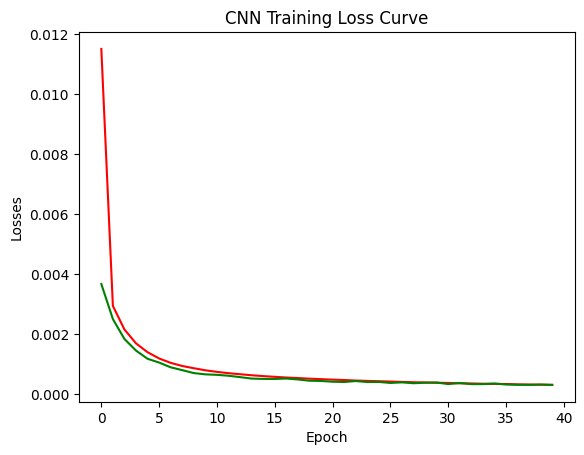

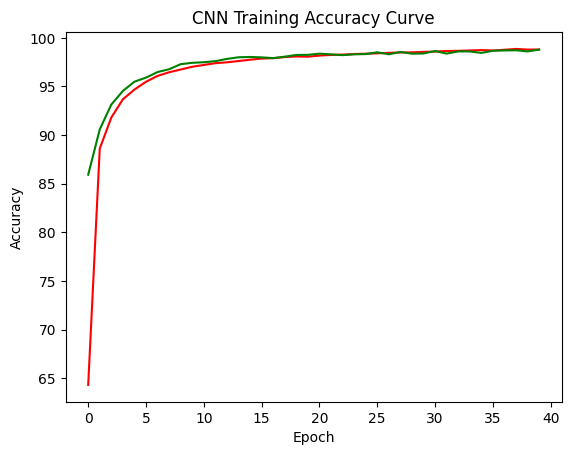

Finished Training


In [53]:
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn.pth'
torch.save(model.state_dict(), PATH)

In [54]:
floaded_model = CNN()
loaded_model.load_state_dict(torch.load(PATH)) # it takes the loaded dictionary, not the path file itself
loaded_model.to(device)

loss,acc = evaluate(loaded_model,test_loader)



Loss on test data: 0.0003
Accuracy on test data: 98.79 %


# **CNN Change order of operations**

In [55]:
epochs = 40
batch_size = 128
learning_rate = 0.01

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [56]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN2(nn.Module):
  def __init__(self):
    super(CNN2, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1
    self.relu3 = nn.ReLU()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = self.conv1(x)#
    x = self.pool1(x)
    x = F.relu(x)
    x = self.conv2(x)
    x = self.pool2(x)
    x= F.relu(x)
    x = F.relu(self.conv3(x))
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN2().to(device)

Epoch [1/40], Step [469/469], Loss: 0.0132, Accuracy: 53.32%
Loss on test data: 0.0040
Accuracy on test data: 85.21 %
Epoch [2/40], Step [469/469], Loss: 0.0032, Accuracy: 87.75%
Loss on test data: 0.0026
Accuracy on test data: 90.14 %
Epoch [3/40], Step [469/469], Loss: 0.0024, Accuracy: 90.81%
Loss on test data: 0.0020
Accuracy on test data: 92.71 %
Epoch [4/40], Step [469/469], Loss: 0.0019, Accuracy: 92.65%
Loss on test data: 0.0016
Accuracy on test data: 94.13 %
Epoch [5/40], Step [469/469], Loss: 0.0015, Accuracy: 94.10%
Loss on test data: 0.0013
Accuracy on test data: 95.31 %
Epoch [6/40], Step [469/469], Loss: 0.0013, Accuracy: 95.11%
Loss on test data: 0.0011
Accuracy on test data: 95.87 %
Epoch [7/40], Step [469/469], Loss: 0.0011, Accuracy: 95.70%
Loss on test data: 0.0010
Accuracy on test data: 96.32 %
Epoch [8/40], Step [469/469], Loss: 0.0010, Accuracy: 96.25%
Loss on test data: 0.0008
Accuracy on test data: 96.68 %
Epoch [9/40], Step [469/469], Loss: 0.0009, Accuracy: 96

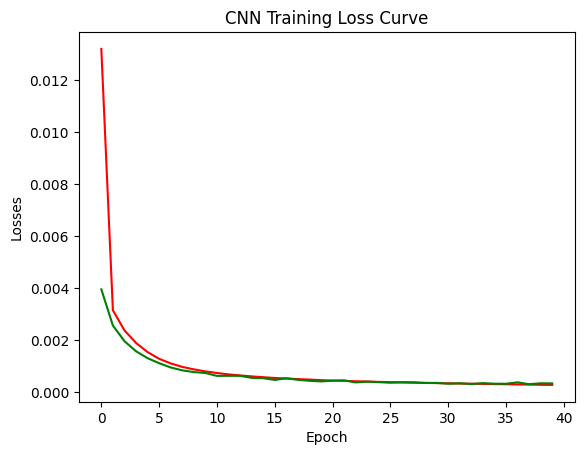

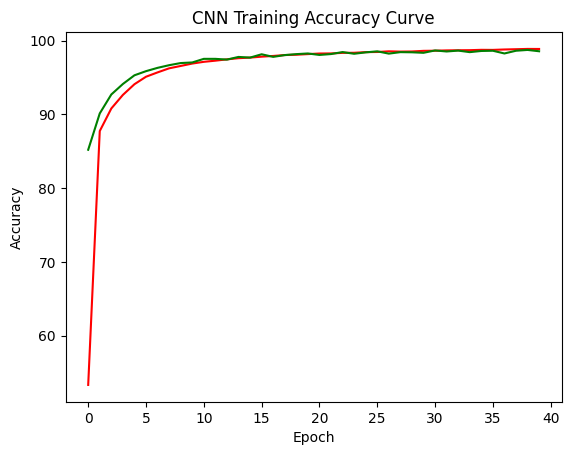

Finished Training


In [57]:
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn2.pth'
torch.save(model.state_dict(), PATH)

In [49]:
loaded_model = CNN2()
loaded_model.load_state_dict(torch.load(PATH)) # it takes the loaded dictionary, not the path file itself
loaded_model.to(device)
loaded_model.eval()

with torch.no_grad():
    n_correct = 0
    n_correct2 = 0
    n_samples = len(test_loader.dataset)

    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # max returns (value ,index)
        _, predicted = torch.max(outputs, 1)
        n_correct += (predicted == labels).sum().item()

        outputs2 = loaded_model(images)
        _, predicted2 = torch.max(outputs2, 1)
        n_correct2 += (predicted2 == labels).sum().item()

    acc = 100.0 * n_correct / n_samples
    print(f'Accuracy of the model: {acc} %')

    acc = 100.0 * n_correct2 / n_samples
    print(f'Accuracy of the loaded model: {acc} %')

Accuracy of the model: 98.15 %
Accuracy of the loaded model: 98.15 %


# **Change activation function**

In [58]:
epochs = 40
batch_size = 128
learning_rate = 0.01

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [61]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN3(nn.Module):
  def __init__(self):
    super(CNN3, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1
    self.sig = nn.Sigmoid()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = self.conv1(x)#
    x = self.pool1(x)
    x = self.sig(x)
    x = self.conv2(x)
    x = self.pool2(x)
    x= self.sig(x)
    x = self.sig(self.conv3(x))
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN3().to(device)

Epoch [1/40], Step [469/469], Loss: 0.0181, Accuracy: 10.39%
Loss on test data: 0.0183
Accuracy on test data: 10.32 %
Epoch [2/40], Step [469/469], Loss: 0.0181, Accuracy: 10.37%
Loss on test data: 0.0182
Accuracy on test data: 10.32 %
Epoch [3/40], Step [469/469], Loss: 0.0180, Accuracy: 10.31%
Loss on test data: 0.0182
Accuracy on test data: 9.80 %
Epoch [4/40], Step [469/469], Loss: 0.0180, Accuracy: 10.34%
Loss on test data: 0.0183
Accuracy on test data: 11.35 %
Epoch [5/40], Step [469/469], Loss: 0.0180, Accuracy: 10.31%
Loss on test data: 0.0183
Accuracy on test data: 11.35 %
Epoch [6/40], Step [469/469], Loss: 0.0180, Accuracy: 10.62%
Loss on test data: 0.0182
Accuracy on test data: 11.35 %
Epoch [7/40], Step [469/469], Loss: 0.0180, Accuracy: 10.61%
Loss on test data: 0.0183
Accuracy on test data: 10.10 %
Epoch [8/40], Step [469/469], Loss: 0.0180, Accuracy: 10.59%
Loss on test data: 0.0182
Accuracy on test data: 10.32 %
Epoch [9/40], Step [469/469], Loss: 0.0180, Accuracy: 10.

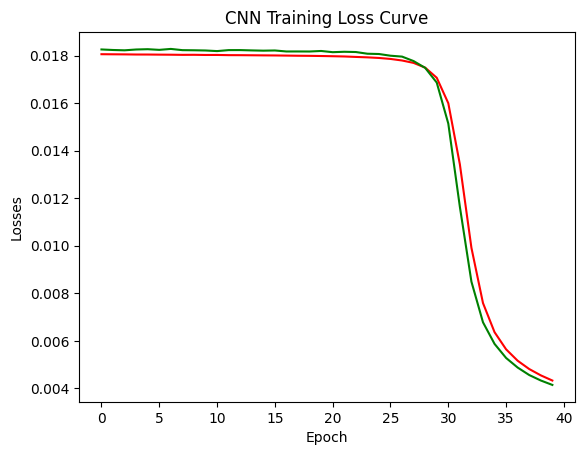

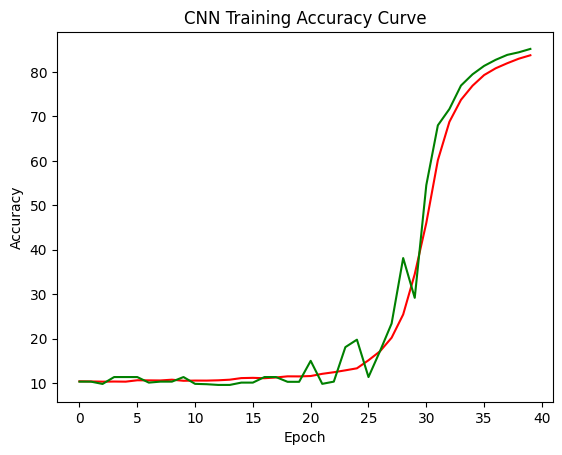

Finished Training


In [62]:
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn3.pth'
torch.save(model.state_dict(), PATH)

# **Adam instead of SGD**

In [69]:
epochs = 40
batch_size = 128
learning_rate = 0.001

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [70]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1
    self.relu3 = nn.ReLU()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = F.relu(self.conv1(x)) #
    x = self.pool1(x)
    x = F.relu(self.conv2(x))
    x = self.pool2(x)
    x = F.relu(self.conv3(x))
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN().to(device)

Epoch [1/40], Step [469/469], Loss: 0.0033, Accuracy: 87.45%
Loss on test data: 0.0010
Accuracy on test data: 96.37 %
Epoch [2/40], Step [469/469], Loss: 0.0008, Accuracy: 96.92%
Loss on test data: 0.0005
Accuracy on test data: 97.93 %
Epoch [3/40], Step [469/469], Loss: 0.0005, Accuracy: 97.95%
Loss on test data: 0.0004
Accuracy on test data: 98.10 %
Epoch [4/40], Step [469/469], Loss: 0.0004, Accuracy: 98.39%
Loss on test data: 0.0004
Accuracy on test data: 98.67 %
Epoch [5/40], Step [469/469], Loss: 0.0003, Accuracy: 98.64%
Loss on test data: 0.0003
Accuracy on test data: 98.64 %
Epoch [6/40], Step [469/469], Loss: 0.0003, Accuracy: 98.82%
Loss on test data: 0.0003
Accuracy on test data: 98.61 %
Epoch [7/40], Step [469/469], Loss: 0.0003, Accuracy: 98.94%
Loss on test data: 0.0003
Accuracy on test data: 98.73 %
Epoch [8/40], Step [469/469], Loss: 0.0002, Accuracy: 99.02%
Loss on test data: 0.0004
Accuracy on test data: 98.51 %
Epoch [9/40], Step [469/469], Loss: 0.0002, Accuracy: 99

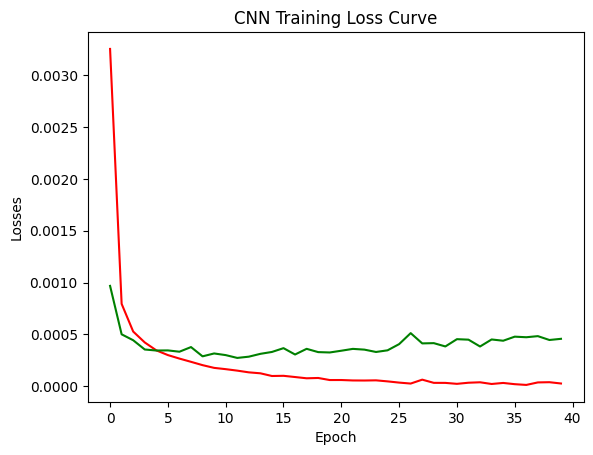

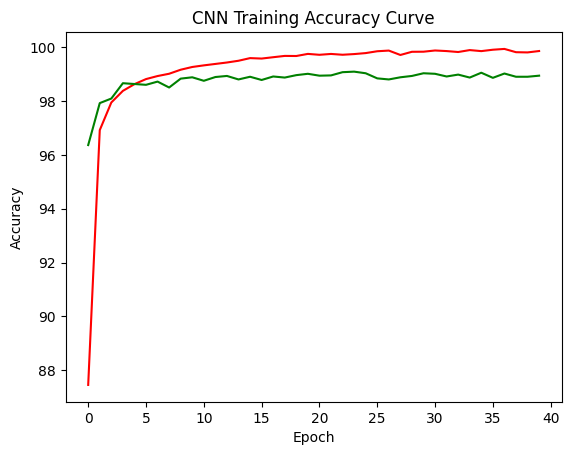

Finished Training


In [71]:
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn3.pth'
torch.save(model.state_dict(), PATH)

# **Variation 1/3**

In [72]:
epochs = 40
batch_size = 128
learning_rate = 0.001

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [73]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.bn1 = nn.BatchNorm2d(8)

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.bn2 = nn.BatchNorm2d(16)

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1
    self.relu3 = nn.ReLU()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = self.conv1(x)
    x = self.bn1(x)
    x = F.relu(x)
    x = self.pool1(x)

    x = self.conv2(x)
    x = self.bn2(x)
    x = F.relu(x)
    x = self.pool2(x)
    x = F.relu(self.conv3(x))
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN().to(device)

Epoch [1/40], Step [469/469], Loss: 0.0016, Accuracy: 94.11%
Loss on test data: 0.0009
Accuracy on test data: 96.15 %
Epoch [2/40], Step [469/469], Loss: 0.0005, Accuracy: 97.89%
Loss on test data: 0.0004
Accuracy on test data: 98.36 %
Epoch [3/40], Step [469/469], Loss: 0.0004, Accuracy: 98.44%
Loss on test data: 0.0004
Accuracy on test data: 98.36 %
Epoch [4/40], Step [469/469], Loss: 0.0003, Accuracy: 98.74%
Loss on test data: 0.0002
Accuracy on test data: 98.96 %
Epoch [5/40], Step [469/469], Loss: 0.0002, Accuracy: 99.06%
Loss on test data: 0.0003
Accuracy on test data: 98.91 %
Epoch [6/40], Step [469/469], Loss: 0.0002, Accuracy: 99.05%
Loss on test data: 0.0004
Accuracy on test data: 98.27 %
Epoch [7/40], Step [469/469], Loss: 0.0002, Accuracy: 99.26%
Loss on test data: 0.0003
Accuracy on test data: 98.70 %
Epoch [8/40], Step [469/469], Loss: 0.0002, Accuracy: 99.35%
Loss on test data: 0.0003
Accuracy on test data: 98.99 %
Epoch [9/40], Step [469/469], Loss: 0.0001, Accuracy: 99

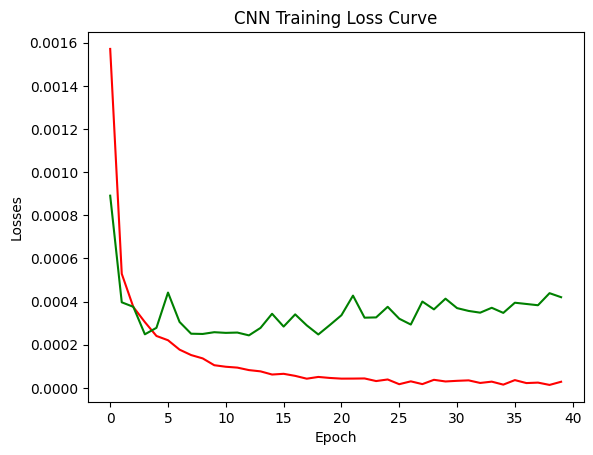

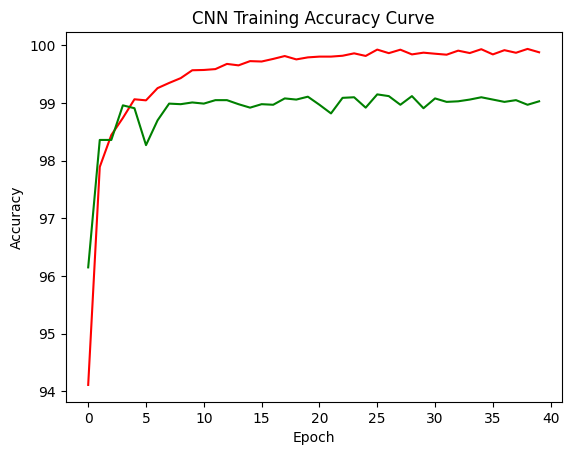

Finished Training


In [74]:
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn3.pth'
torch.save(model.state_dict(), PATH)

# **Variation 2/3, Adding lr scheduler**

In [ ]:
epochs = 25
batch_size = 128
learning_rate = 0.001

# MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.MNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor())

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=batch_size,
                                          shuffle=False)

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np


class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 8, 3, stride=1, padding=1)  # 8 times 3x3x1 convolutions with stride 1 and padding 1

    self.bn1 = nn.BatchNorm2d(8)

    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)  # 16 times 3x3x8 convolutions with stride 1 and padding 1

    self.bn2 = nn.BatchNorm2d(16)

    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)  # 2x2 max pooling with stride 2

    self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  # 32 times 3x3x16 convolutions with stride 1 and padding 1

    self.bn3 = nn.BatchNorm2d(32)
    self.relu3 = nn.ReLU()  # ReLU non-linearity

    self.fc = nn.Linear(32 * 7 * 7, 10)  # Fully connected layer with 10 output neurons

  def forward(self, x):
    #N,1,28,28
    x = self.conv1(x)
    x = self.bn1(x)
    x = F.relu(x)
    x = self.pool1(x)

    x = self.conv2(x)
    x = self.bn2(x)
    x = F.relu(x)
    x = self.pool2(x)

    x = self.conv3(x)
    x = self.bn3(x)
    x= F.relu(x)
    x = torch.flatten(x, 1)
    x = self.fc(x)
    return x

model = CNN().to(device)

Epoch [1/25], Step [469/469], Loss: 0.0012, Accuracy: 95.73%
Loss on test data: 0.0004
Accuracy on test data: 98.33 %
Epoch [2/25], Step [469/469], Loss: 0.0004, Accuracy: 98.56%
Loss on test data: 0.0003
Accuracy on test data: 98.77 %
Epoch [3/25], Step [469/469], Loss: 0.0003, Accuracy: 98.98%
Loss on test data: 0.0003
Accuracy on test data: 99.00 %
Epoch [4/25], Step [469/469], Loss: 0.0002, Accuracy: 99.15%
Loss on test data: 0.0003
Accuracy on test data: 98.87 %
Epoch [5/25], Step [469/469], Loss: 0.0002, Accuracy: 99.30%
Loss on test data: 0.0003
Accuracy on test data: 98.68 %
Epoch [6/25], Step [469/469], Loss: 0.0001, Accuracy: 99.44%
Loss on test data: 0.0003
Accuracy on test data: 98.77 %
Epoch [7/25], Step [469/469], Loss: 0.0001, Accuracy: 99.52%
Loss on test data: 0.0003
Accuracy on test data: 98.93 %
Epoch [8/25], Step [469/469], Loss: 0.0001, Accuracy: 99.59%
Loss on test data: 0.0002
Accuracy on test data: 99.01 %
Epoch [9/25], Step [469/469], Loss: 0.0000, Accuracy: 99

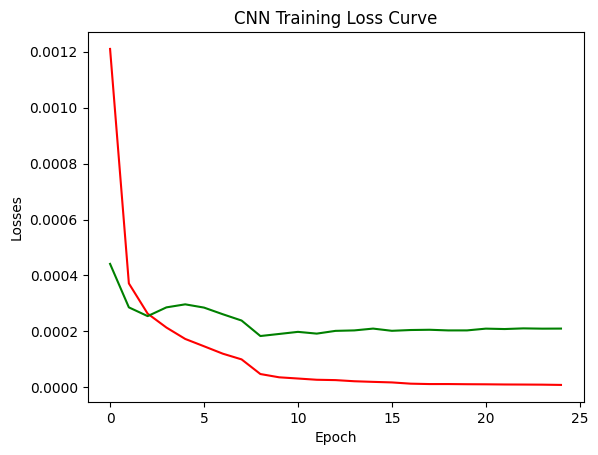

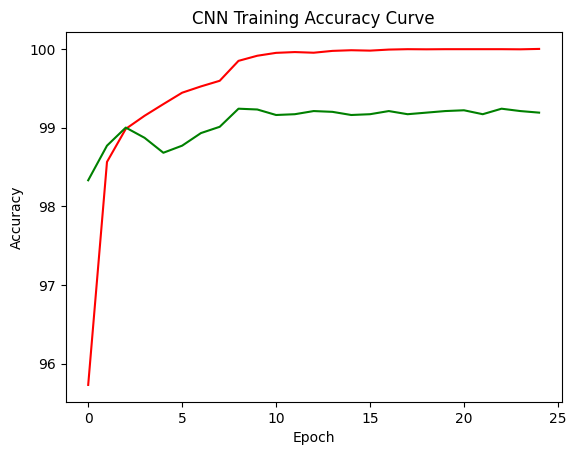

Finished Training


In [ ]:
import torch.optim.lr_scheduler as lr_scheduler

cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.2)  # Decrease LR by a factor of 0.1 every 5 epochs


n_total_steps = len(train_loader)

accs = []
losses = []
test_accs = []
test_losses = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    n_correct = 0
    n_samples = 0  # Track the total number of samples

    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = cross_entropy_loss(outputs, labels)
        #print('Training loss:', loss)
        running_loss += loss.item()


        # Accuracy calculation
        _, predicted = torch.max(outputs.data, 1)  # Get predicted class labels
        n_samples += labels.size(0)                # Add number of samples in this batch
        n_correct += (predicted == labels).sum().item()  # Count correct predictions

        # Backward and optimize
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


    # Calculate accuracy at the end of each epoch
    accuracy = 100.0 * n_correct / n_samples

    print(f'Epoch [{epoch+1}/{epochs}], Step [{i+1}/{n_total_steps}], Loss: {running_loss/n_samples:.4f}, Accuracy: {accuracy:.2f}%')
    losses.append(running_loss/n_samples)
    #print(losses)
    accs.append(accuracy)
    test_loss,test_acc = evaluate(model,test_loader)
    test_losses.append(test_loss)
    test_accs.append(test_acc)
    scheduler.step()


num_epochs = [i for i in range(epochs)]
plt.plot(num_epochs, losses, color = 'r', label ="Training Loss")

plt.plot(num_epochs,test_losses,color = 'g',label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Losses')
plt.title('CNN Training Loss Curve')
plt.show()

plt.plot(num_epochs,accs,color = "r",label = "Training Accuraccy")
plt.plot(num_epochs,test_accs,color = "g",label = "Test Accuraccy")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CNN Training Accuracy Curve')
plt.show()



print('Finished Training')
PATH = './cnn3.pth'
torch.save(model.state_dict(), PATH)

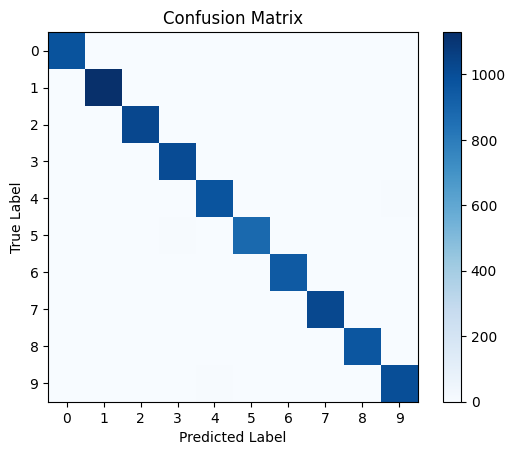

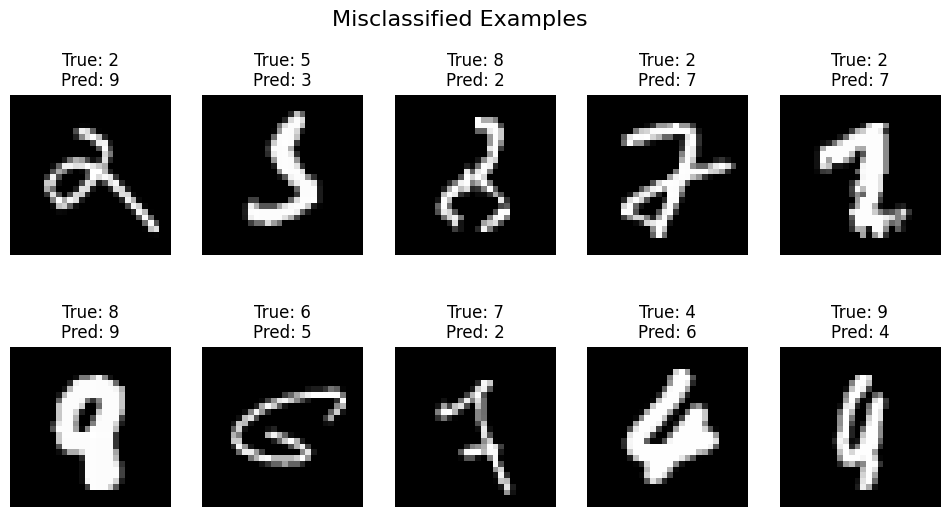

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
from torchvision.utils import make_grid

def get_misclassified_samples(model, loader, device, num_samples=10):
    model.eval()
    misclassified = []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            # Find misclassified indices
            incorrect_indices = (preds != labels).nonzero(as_tuple=True)[0]
            for idx in incorrect_indices:
                misclassified.append((images[idx], labels[idx], preds[idx]))
                if len(misclassified) >= num_samples:
                    return misclassified  # Return early if we have enough samples
    return misclassified  # Return all misclassified samples if fewer than num_samples found

# Assuming you have 'test_loader' and 'model' defined
all_preds = []
all_labels = []

# Collect predictions and labels for confusion matrix
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Generate confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.imshow(cm, cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.colorbar()
plt.xticks(np.arange(10))
plt.yticks(np.arange(10))
plt.show()

# Get misclassified samples
misclassified_samples = get_misclassified_samples(model, test_loader, device)

# Plot misclassified samples
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
fig.suptitle('Misclassified Examples', fontsize=16)

for i, (image, true_label, pred_label) in enumerate(misclassified_samples):
    ax = axes.flatten()[i]
    image = image.squeeze().cpu()
    ax.imshow(image, cmap='gray')
    ax.set_title(f'True: {true_label}\nPred: {pred_label}')
    ax.axis('off')

plt.show()


# **WARWICK BIOMEDICAL DATASET**

In [1]:
!unzip WARWICK.zip

Archive:  WARWICK.zip
   creating: WARWICK/
   creating: WARWICK/Test/
  inflating: WARWICK/Test/image_33.png  
  inflating: WARWICK/Test/image_43.png  
 extracting: WARWICK/Test/label_23.png  
  inflating: WARWICK/Test/image_41.png  
 extracting: WARWICK/Test/label_43.png  
 extracting: WARWICK/Test/label_25.png  
  inflating: WARWICK/Test/image_04.png  
 extracting: WARWICK/Test/label_35.png  
  inflating: WARWICK/Test/image_46.png  
  inflating: WARWICK/Test/image_30.png  
 extracting: WARWICK/Test/label_24.png  
 extracting: WARWICK/Test/label_55.png  
 extracting: WARWICK/Test/label_13.png  
 extracting: WARWICK/Test/label_53.png  
 extracting: WARWICK/Test/label_57.png  
  inflating: WARWICK/Test/image_38.png  
 extracting: WARWICK/Test/image_37.png  
  inflating: WARWICK/Test/image_24.png  
 extracting: WARWICK/Test/label_10.png  
 extracting: WARWICK/Test/label_27.png  
 extracting: WARWICK/Test/label_15.png  
  inflating: WARWICK/Test/image_05.png  
 extracting: WARWICK/Test/i

In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import re
import os
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:


class WarwickDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform

        # Get all filenames and sort them
        filenames = os.listdir(data_dir)
        filenames.sort(key=lambda x: int(re.search(r'\d+', x).group())) # Sort by the number in the filename

        # Separate image and mask filenames
        self.image_filenames = [filename for filename in filenames if 'image' in filename]
        self.mask_filenames = [filename for filename in filenames if 'label' in filename]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_dir, self.image_filenames[idx])
        mask_path = os.path.join(self.data_dir, self.mask_filenames[idx])

        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')

        if self.transform is not None:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask


In [21]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Example resizing
    transforms.ToTensor(),
])

BATCH_SIZE = 32

train_dataset = WarwickDataset('WARWICK/Train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = WarwickDataset('WARWICK/Test', transform=transform)
test_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False)

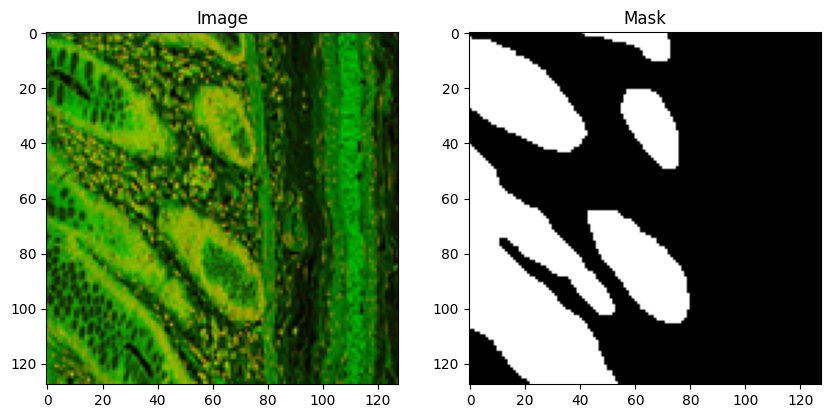

In [5]:


import matplotlib.pyplot as plt

# Get a sample from the dataset
image, mask = train_dataset[1]  # Get the first image-mask pair

# Convert tensors back to PIL Images for visualization
image = transforms.ToPILImage()(image)
mask = transforms.ToPILImage()(mask)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Image')

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')

plt.show()


# **1st VARIATION**

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegmentationCNN(nn.Module):
    def __init__(self):
        super(SegmentationCNN, self).__init__()

        # Encoder
        self.conv1 = nn.Conv2d(3, 8, 3, stride=1, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
        self.relu3 = nn.ReLU()

        # Decoder
        self.deconv1 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        self.relu4 = nn.ReLU()

        self.deconv2 = nn.ConvTranspose2d(16, 8, 4, stride=2, padding=1)
        self.relu5 = nn.ReLU()

        # Final Layer
        self.conv_out = nn.Conv2d(8, 1, 1)  # 1 output channel for binary segmentation

        #We dont need sigmoid at the end cuz it will be taken care of by the loss function

    def forward(self, x):
        # Encoder
        x = self.pool1(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))
        x = self.relu3(self.conv3(x))

        # Decoder
        x = self.relu4(self.deconv1(x))
        x = self.relu5(self.deconv2(x))

        # Output
        x = self.conv_out(x)
        return x


# **2nd VARIATION add batchnorm**

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegmentationCNN(nn.Module):
    def __init__(self):
        super(SegmentationCNN, self).__init__()

        # Encoder
        self.conv1 = nn.Conv2d(3, 8, 3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(8)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(16)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        self.relu3 = nn.ReLU()

        # Decoder
        self.deconv1 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(16)
        self.relu4 = nn.ReLU()

        self.deconv2 = nn.ConvTranspose2d(16, 8, 4, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(8)
        self.relu5 = nn.ReLU()

        # Final Layer
        self.conv_out = nn.Conv2d(8, 1, 1)  # 1 output channel for binary segmentation

        #We dont need sigmoid at the end cuz it will be taken care of by the loss function

    def forward(self, x):
        # Encoder
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.relu3(self.bn3(self.conv3(x)))

        # Decoder
        x = self.relu4(self.bn4(self.deconv1(x)))
        x = self.relu5(self.bn5(self.deconv2(x)))

        # Output
        x = self.conv_out(x)
        return x


# **3rd VARIATION change batch size to 16**

In [28]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Example resizing
    transforms.ToTensor(),
])

BATCH_SIZE = 16

train_dataset = WarwickDataset('WARWICK/Train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = WarwickDataset('WARWICK/Test', transform=transform)
test_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegmentationCNN(nn.Module):
    def __init__(self):
        super(SegmentationCNN, self).__init__()

        # Encoder
        self.conv1 = nn.Conv2d(3, 8, 3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(8)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(16)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        self.relu3 = nn.ReLU()

        # Decoder
        self.deconv1 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(16)
        self.relu4 = nn.ReLU()

        self.deconv2 = nn.ConvTranspose2d(16, 8, 4, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(8)
        self.relu5 = nn.ReLU()

        # Final Layer
        self.conv_out = nn.Conv2d(8, 1, 1)  # 1 output channel for binary segmentation

        #We dont need sigmoid at the end cuz it will be taken care of by the loss function

    def forward(self, x):
        # Encoder
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.relu3(self.bn3(self.conv3(x)))

        # Decoder
        x = self.relu4(self.bn4(self.deconv1(x)))
        x = self.relu5(self.bn5(self.deconv2(x)))

        # Output
        x = self.conv_out(x)
        return x


# **Training loop**

In [24]:
# Dice Score Function
def dice_score(pred, target):
    smooth = 1.0
    pred = torch.sigmoid(pred)  # Apply sigmoid to get probabilities
    pred = torch.round(pred)  # Threshold probabilities
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    dice = (2.0 * (intersection + smooth)) / (union + smooth)
    return dice.item()  # Return a single scalar value

Epoch [1/100], Train Loss: 0.6596, Train Dice: 0.5284, Test Loss: 0.6960, Test Dice: 0.6685
Epoch [2/100], Train Loss: 0.5894, Train Dice: 0.6395, Test Loss: 0.9887, Test Dice: 0.6721
Epoch [3/100], Train Loss: 0.5383, Train Dice: 0.7220, Test Loss: 1.3935, Test Dice: 0.6724
Epoch [4/100], Train Loss: 0.5049, Train Dice: 0.7572, Test Loss: 1.3023, Test Dice: 0.6723
Epoch [5/100], Train Loss: 0.4750, Train Dice: 0.7726, Test Loss: 1.1234, Test Dice: 0.6735
Epoch [6/100], Train Loss: 0.4479, Train Dice: 0.7919, Test Loss: 0.5157, Test Dice: 0.7679
Epoch [7/100], Train Loss: 0.4368, Train Dice: 0.8037, Test Loss: 0.4798, Test Dice: 0.7936
Epoch [8/100], Train Loss: 0.4514, Train Dice: 0.7944, Test Loss: 0.4714, Test Dice: 0.7966
Epoch [9/100], Train Loss: 0.4312, Train Dice: 0.7993, Test Loss: 0.5782, Test Dice: 0.7673
Epoch [10/100], Train Loss: 0.4074, Train Dice: 0.8100, Test Loss: 0.3982, Test Dice: 0.8285
Epoch [11/100], Train Loss: 0.4037, Train Dice: 0.8183, Test Loss: 0.4636, Test

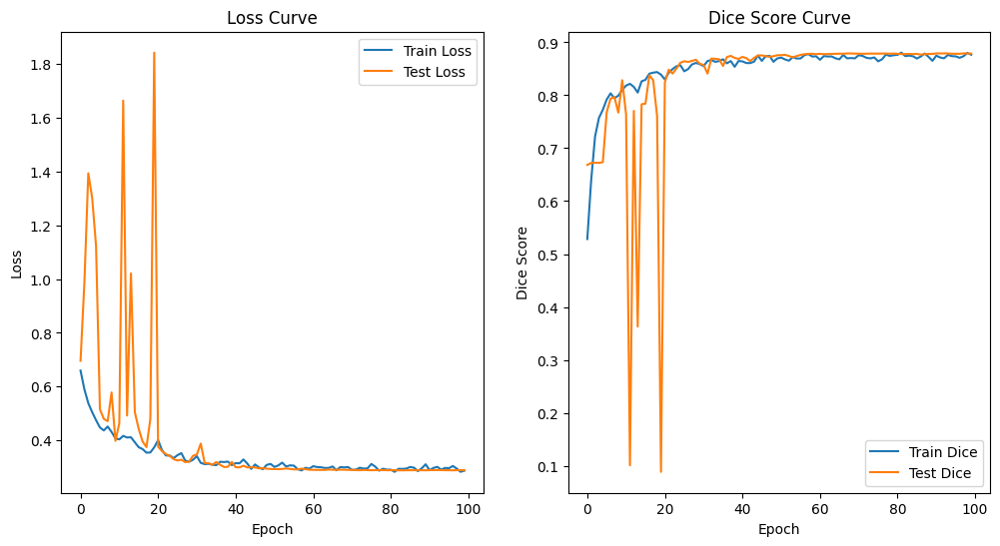

In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

# Training Parameters
epochs = 100
learning_rate = 0.01
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model and Optimizer
model = SegmentationCNN().to(device)
criterion = nn.BCEWithLogitsLoss()  # Binary Cross Entropy with logits loss
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
scheduler = lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.2)


# Training Loop
train_losses = []
test_losses = []
train_dices = []
test_dices = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    running_dice = 0.0
    n_batches = 0
    for images, masks in train_loader:
        images = images.to(device)
        masks = masks.to(device)
        n_batches += 1

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        running_dice += dice_score(outputs, masks)

    epoch_loss = running_loss / n_batches
    epoch_dice = running_dice / n_batches
    train_losses.append(epoch_loss)
    train_dices.append(epoch_dice)

    model.eval()
    test_loss = 0.0
    test_dice = 0.0
    n_batches = 0
    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)
            n_batches += 1

            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item()
            test_dice += dice_score(outputs, masks)

    test_loss /= n_batches
    test_dice /= n_batches
    test_losses.append(test_loss)
    test_dices.append(test_dice)
    scheduler.step()

    # Print Metrics
    print(f'Epoch [{epoch+1}/{epochs}], Train Loss: {epoch_loss:.4f}, Train Dice: {epoch_dice:.4f}, Test Loss: {test_loss:.4f}, Test Dice: {test_dice:.4f}')

# Plotting the Results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(train_dices, label='Train Dice')
plt.plot(test_dices, label='Test Dice')
plt.xlabel('Epoch')
plt.ylabel('Dice Score')
plt.legend()
plt.title('Dice Score Curve')

plt.show()


In [30]:
import matplotlib.pyplot as plt
from torchvision import transforms

def predict_and_visualize(model, test_loader, threshold=0.5):
    """
    Predicts segmentation masks for the test dataset and visualizes the results.

    Args:
        model (nn.Module): The trained segmentation model.
        test_loader (DataLoader): DataLoader for the test dataset.
        threshold (float): Threshold for converting probabilities to binary masks.
    """

    model.eval()

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)
            #print(dice_score(outputs,masks))

            for i in range(images.shape[0]):  # Iterate over images in the batch
                # Convert output probabilities to binary mask
                if dice_score(outputs[i],masks[i]) >0.91 or dice_score(outputs[i],masks[i]) < 0.60:
                  print("Dice score : ", dice_score(outputs[i],masks[i]))
                  mask_pred = torch.sigmoid(outputs[i]) > threshold
                  # Convert the boolean mask to a uint8 tensor
                  mask_pred = mask_pred.float().cpu() * 255
                  mask_pred = mask_pred.to(torch.uint8)

                  # Convert tensors back to PIL Images for visualization
                  image = transforms.ToPILImage()(images[i].cpu())
                  mask_true = transforms.ToPILImage()(masks[i].cpu())
                  mask_pred = transforms.ToPILImage()(mask_pred)  # Now it should work

                  # Display the results
                  plt.figure(figsize=(15, 5))
                  plt.subplot(1, 3, 1)
                  plt.imshow(image)
                  plt.title('Original Image')

                  plt.subplot(1, 3, 2)
                  plt.imshow(mask_true, cmap='gray')
                  plt.title('True Mask')

                  plt.subplot(1, 3, 3)
                  plt.imshow(mask_pred, cmap='gray')
                  plt.title('Predicted Mask')

                  plt.show()


Dice score :  0.9186282157897949


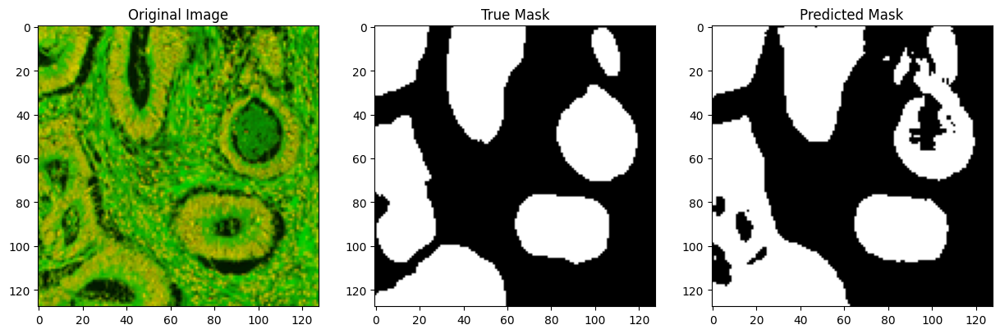

Dice score :  0.9304989576339722


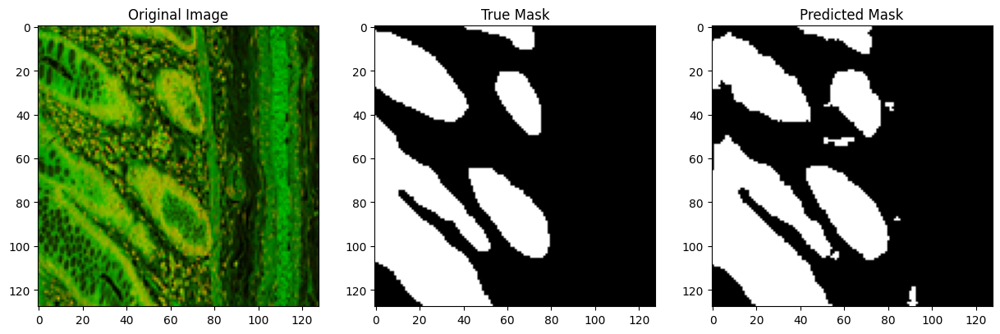

Dice score :  0.918864905834198


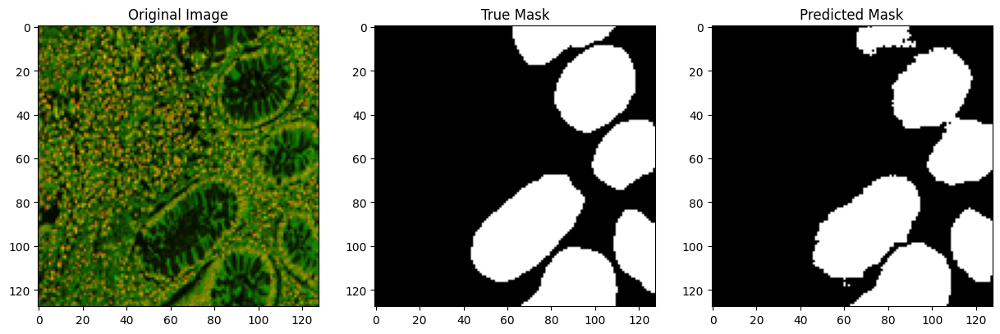

Dice score :  0.947700023651123


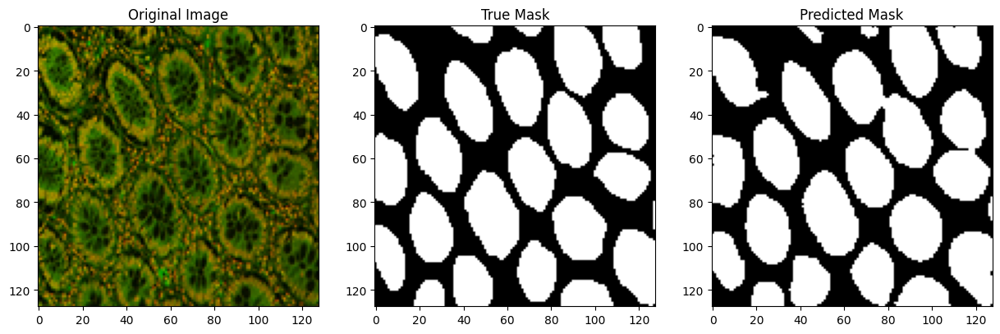

Dice score :  0.9362773895263672


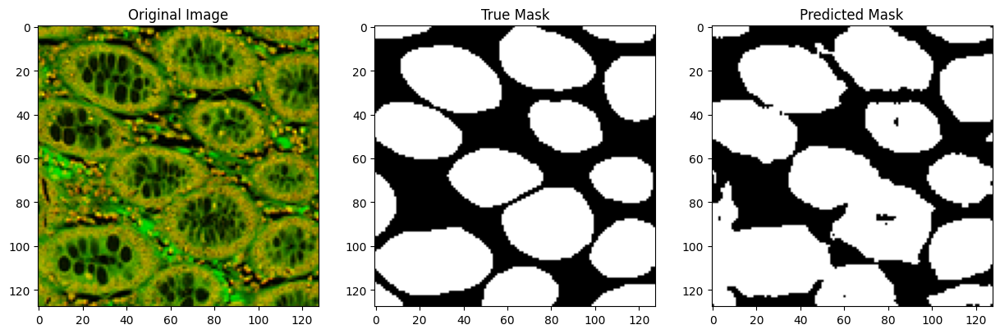

Dice score :  0.9163205027580261


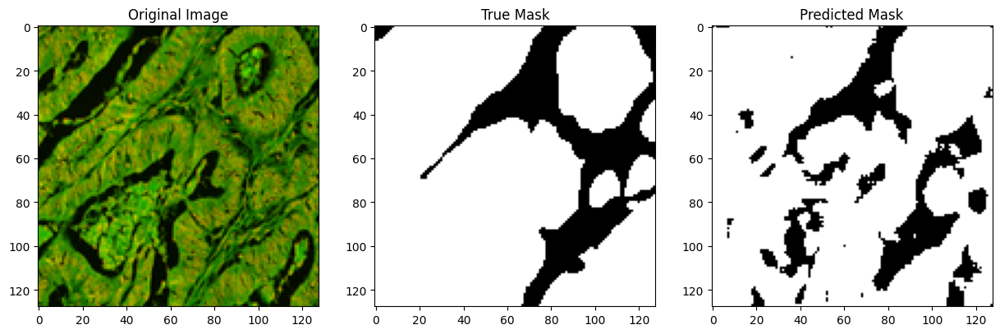

Dice score :  0.9192790985107422


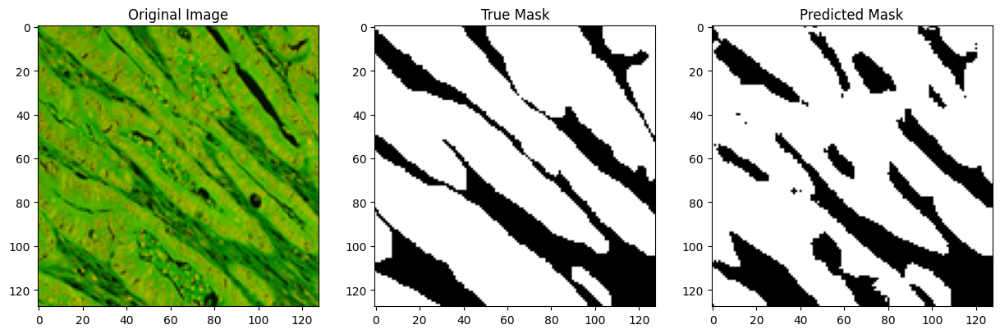

Dice score :  0.9320369958877563


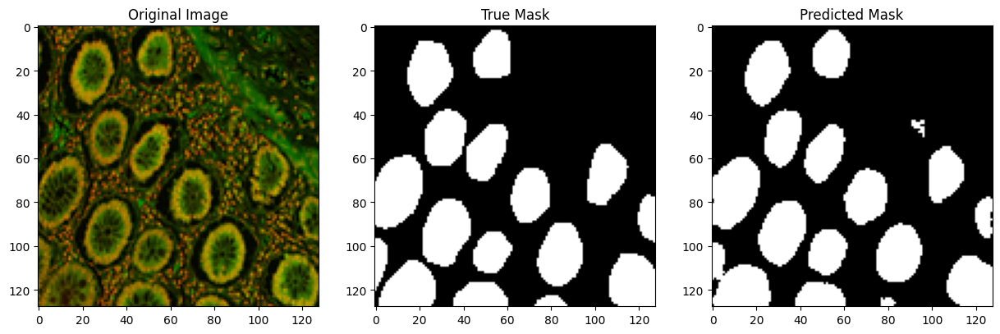

Dice score :  0.926660418510437


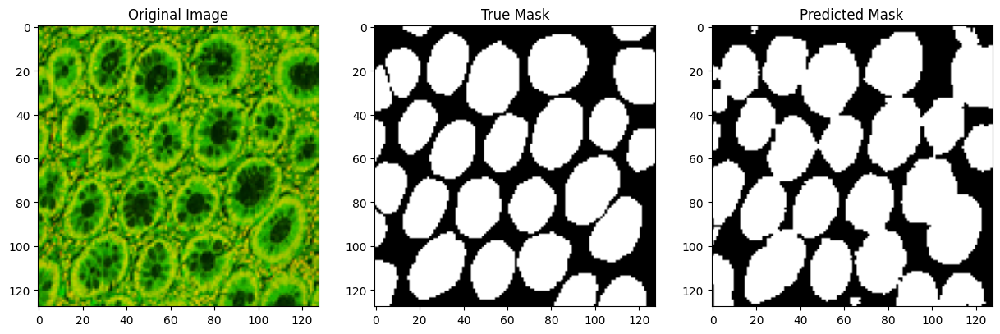

Dice score :  0.9308335185050964


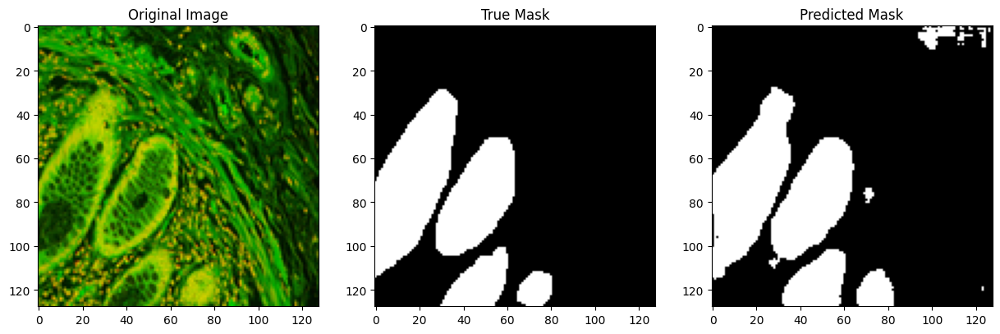

Dice score :  0.9196416139602661


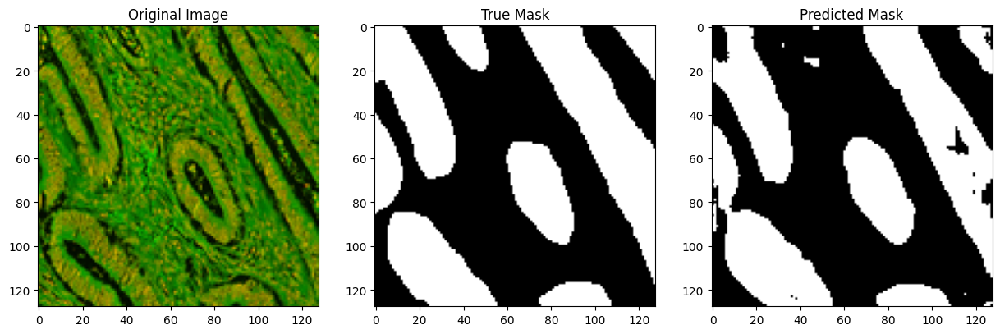

Dice score :  0.9410308003425598


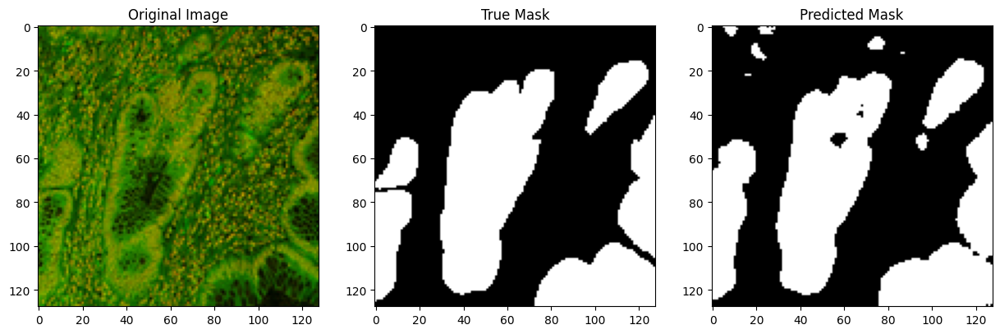

Dice score :  0.9118365049362183


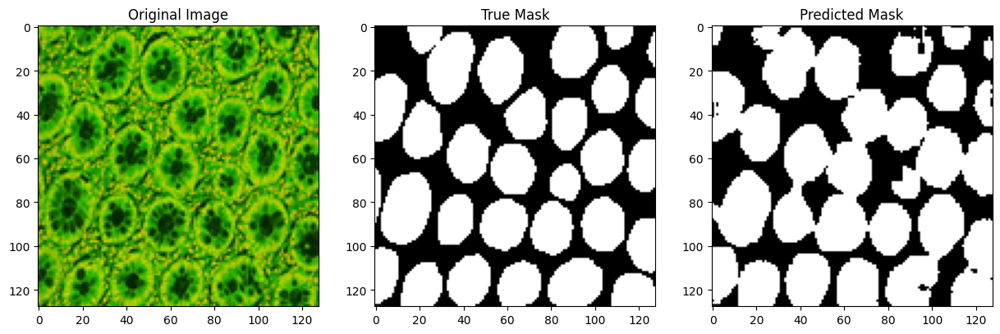

Dice score :  0.9445695877075195


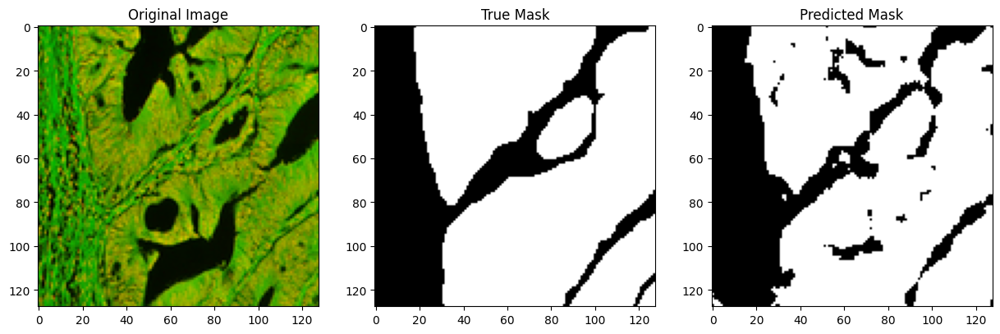

Dice score :  0.9116070866584778


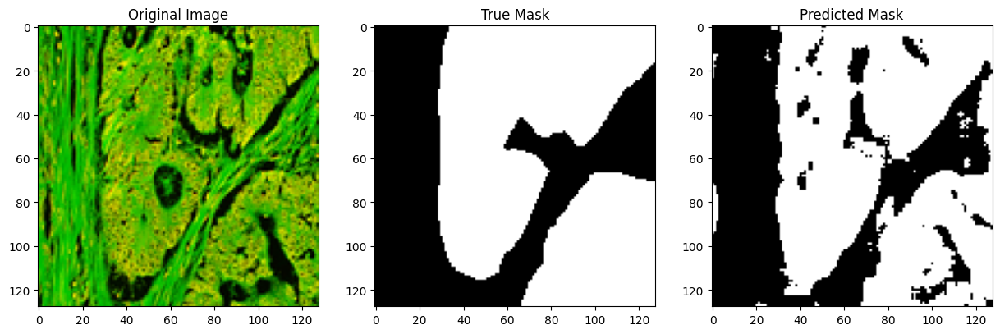

Dice score :  0.9274770021438599


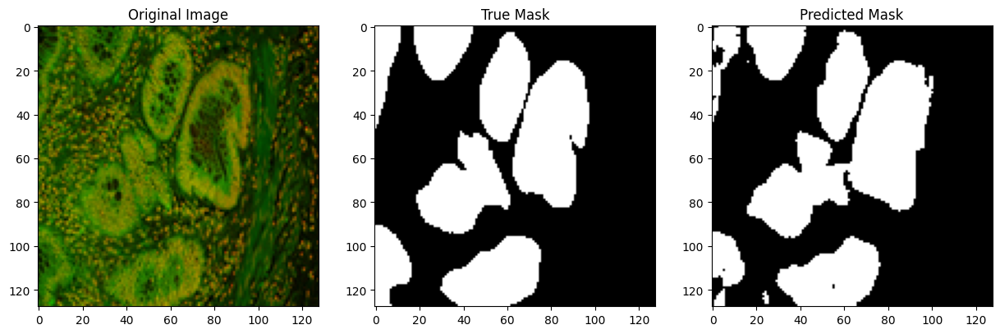

Dice score :  0.9107474684715271


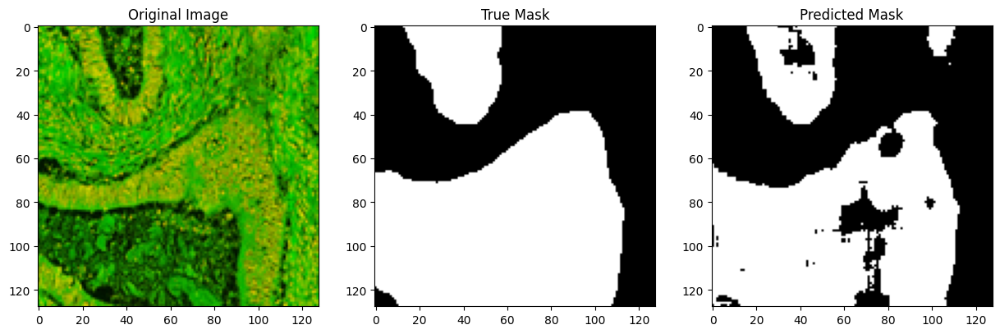

Dice score :  0.9337242245674133


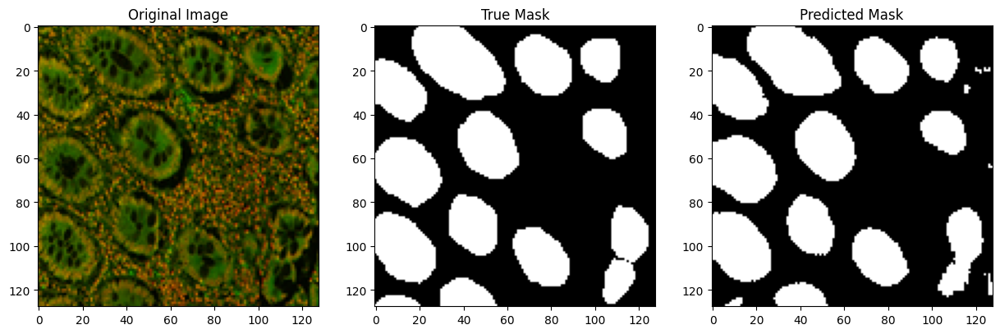

Dice score :  0.9300469756126404


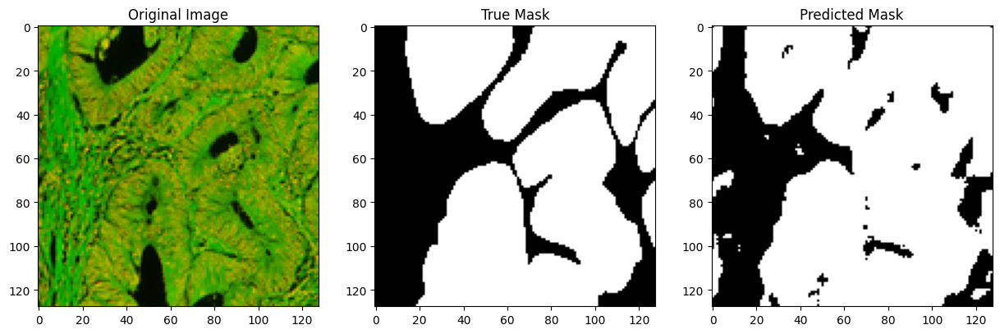

Dice score :  0.9426718950271606


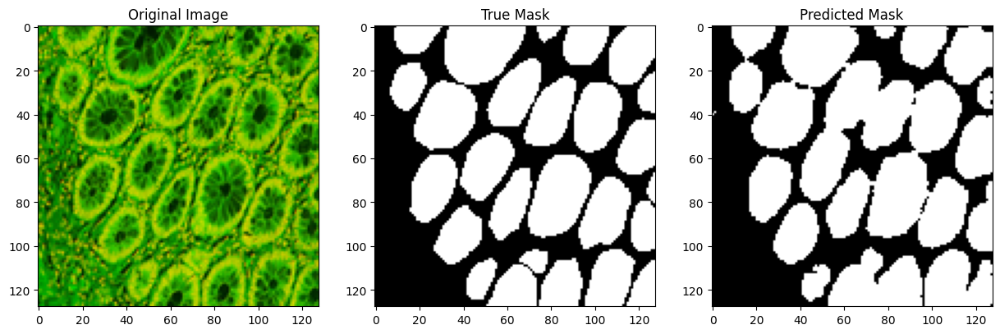

Dice score :  0.9460489749908447


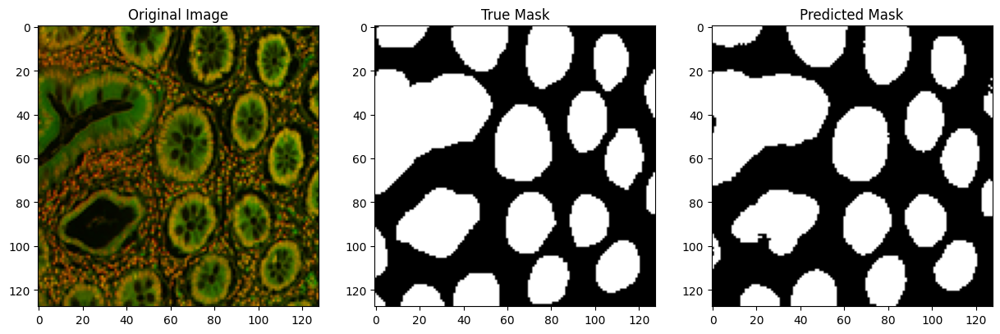

Dice score :  0.9157211780548096


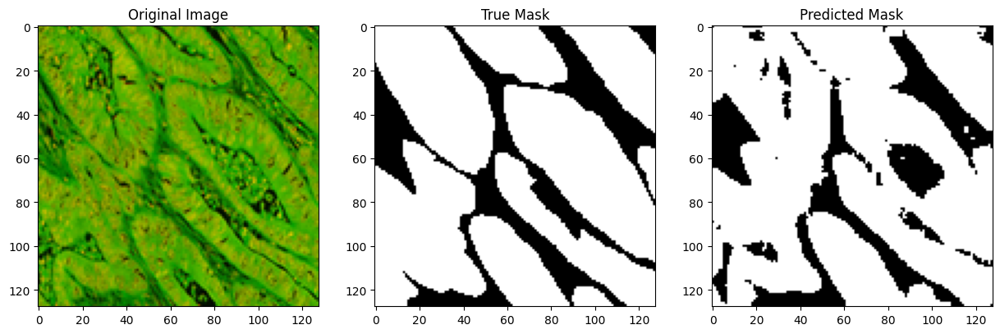

Dice score :  0.9345589876174927


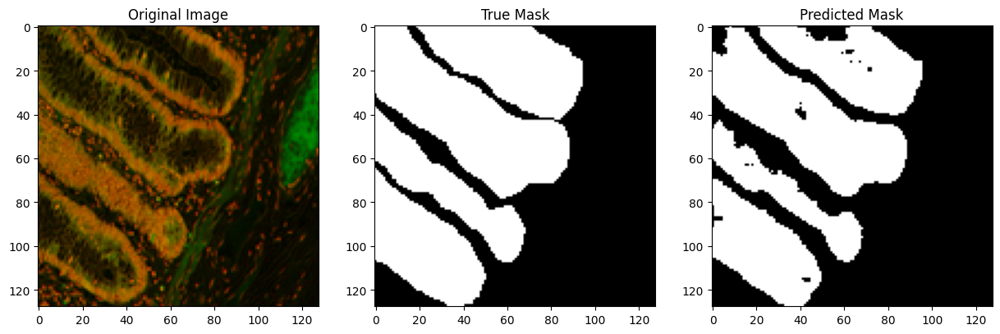

Dice score :  0.9351437091827393


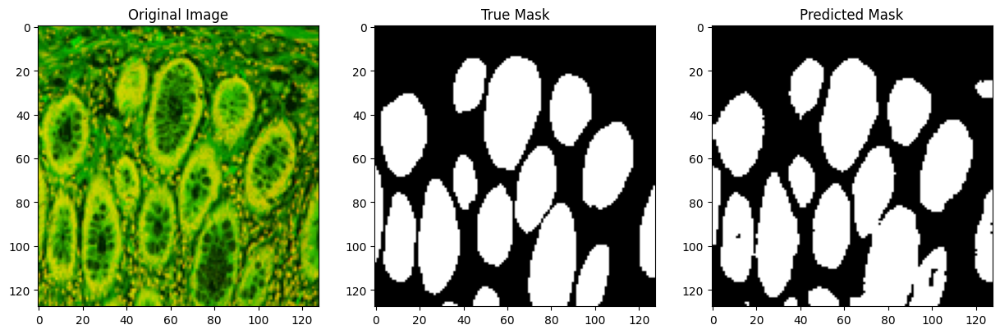

Dice score :  0.9411764740943909


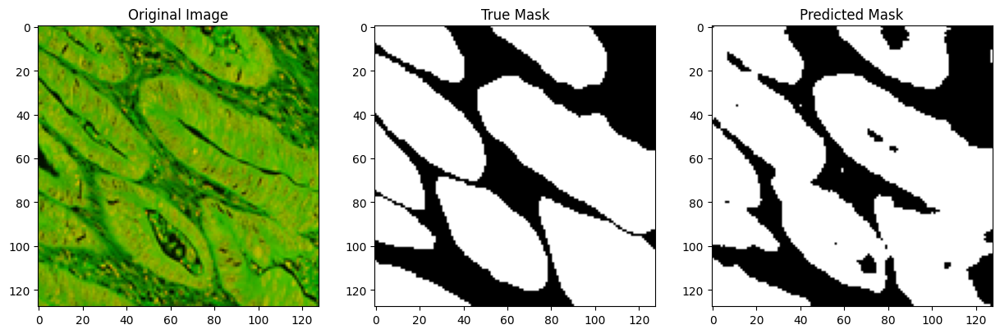

Dice score :  0.911068856716156


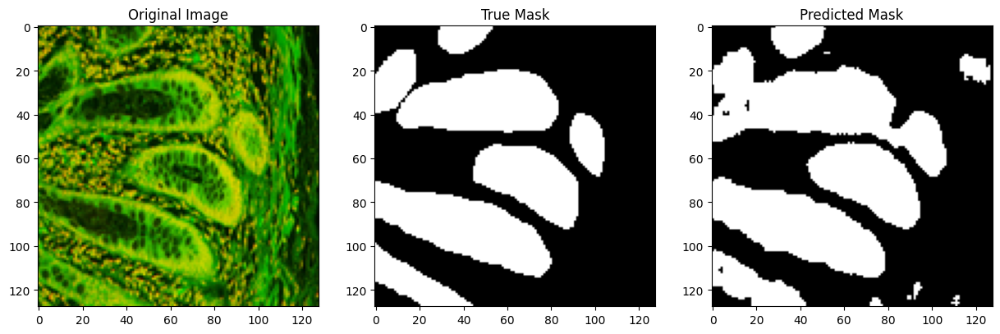

Dice score :  0.9277726411819458


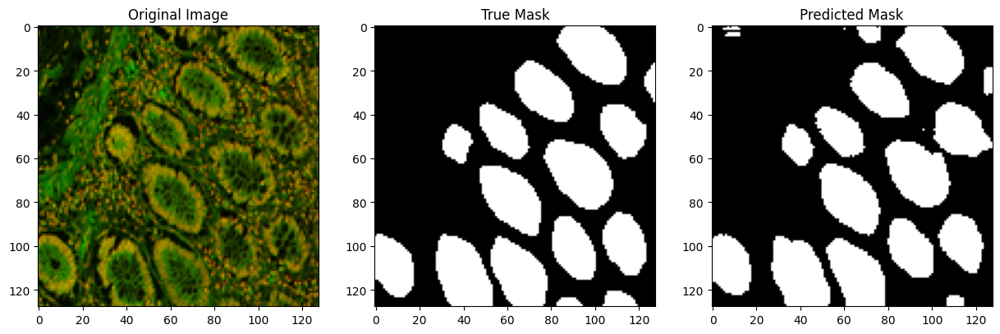

Dice score :  0.9415860772132874


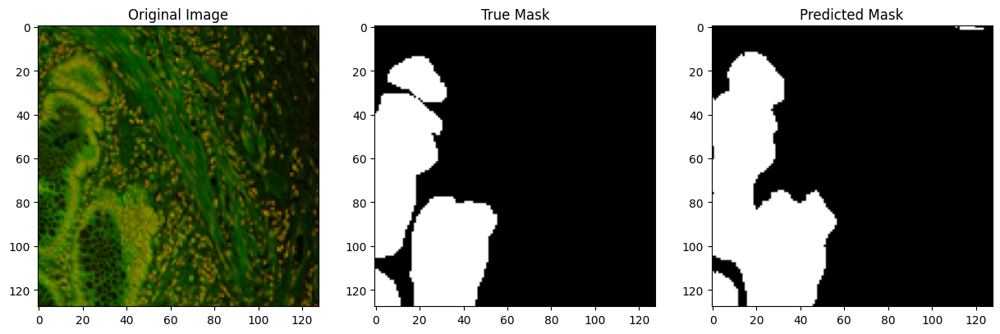

Dice score :  0.5388325452804565


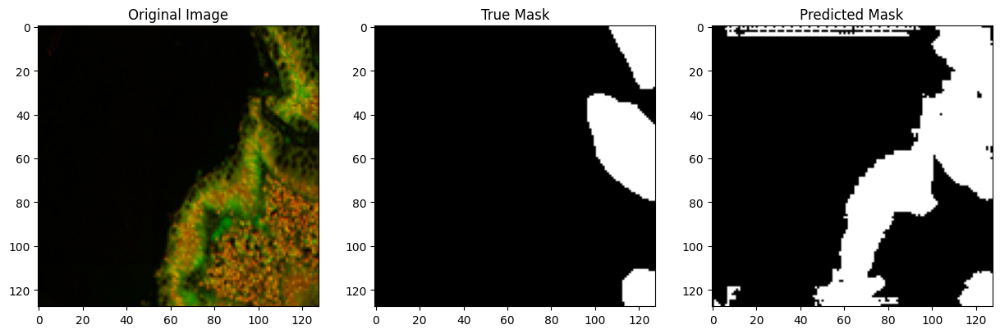

Dice score :  0.9412605166435242


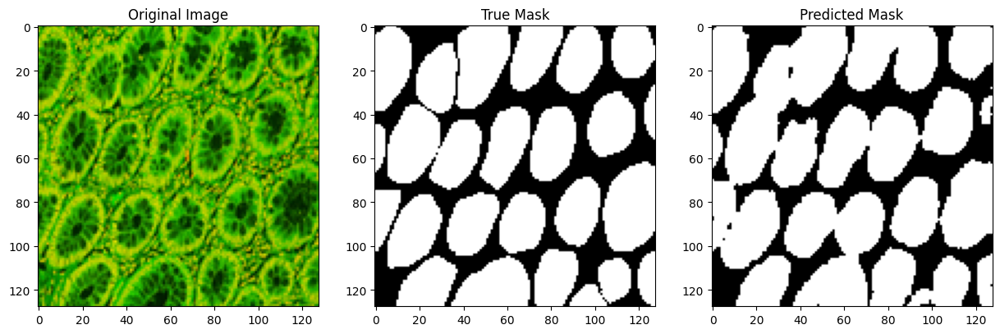

Dice score :  0.925115704536438


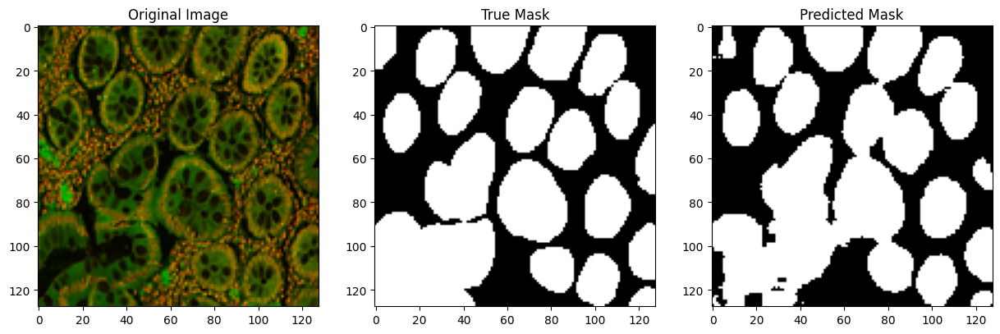

Dice score :  0.9335606098175049


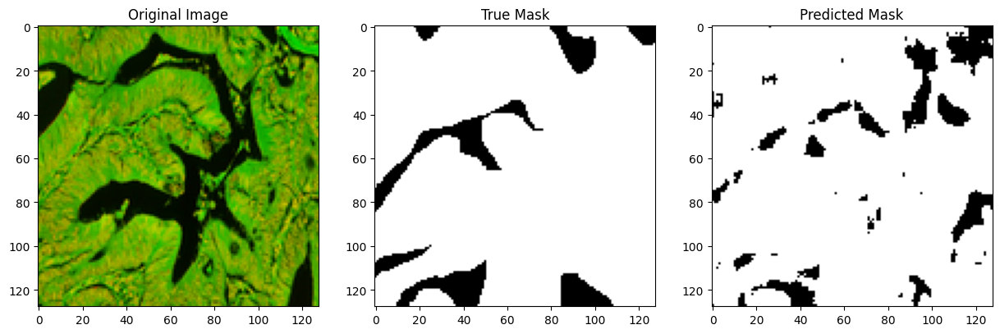

Dice score :  0.9533777236938477


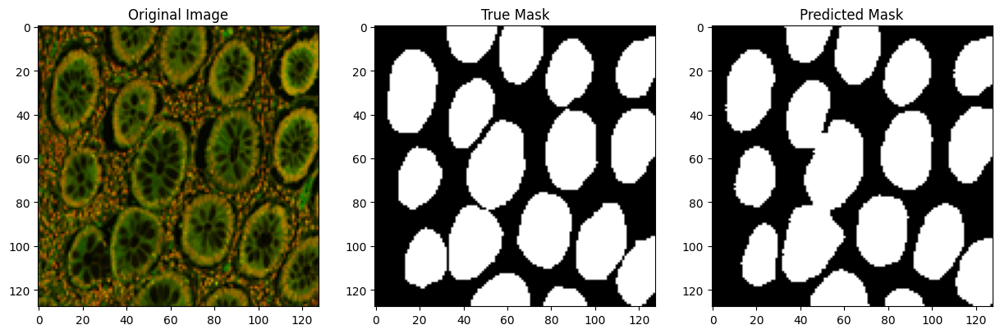

Dice score :  0.9424169659614563


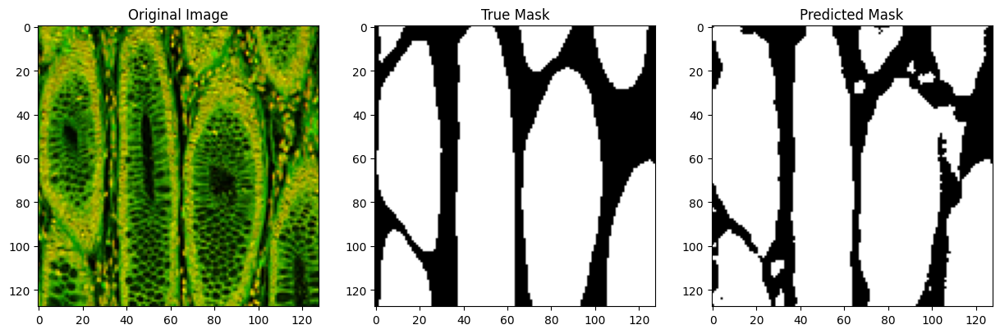

In [31]:
results = predict_and_visualize(model, test_loader, threshold=0.5)